In [41]:
# Loading the Packages
%reload_ext autoreload
%autoreload 2

# basic packages
import warnings
warnings.filterwarnings('ignore')
import os
import sys
from pathlib import Path
from tqdm import tqdm
import scanpy as sc

# Apply monkey patch before importing DECIPHER
import matplotlib_inline.backend_inline
import IPython.display
IPython.display.set_matplotlib_formats = matplotlib_inline.backend_inline.set_matplotlib_formats

from decipher import DECIPHER, CFG
from decipher.utils import scanpy_viz

CFG.omics.spatial_graph.mode = 'radius'
CFG.omics.spatial_graph.radius = 300

import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams.update({
    "pgf.texsystem": "xelatex",      # 使用 XeLaTeX，如果不需要 LaTeX 公式渲染，可以省略
    'font.family': 'serif',          # 字体设置为衬线字体
    'text.usetex': False,            # 禁用 LaTeX，使用 Matplotlib 内置文字渲染
    'pgf.rcfonts': False,            # 禁用 pgf 的默认字体管理
    'pdf.fonttype': 42,              # 确保字体为 TrueType 格式，可被 Illustrator 编辑
    'ps.fonttype': 42,               # EPS 文件也使用 TrueType 格式
    'figure.dpi': 300,               # 设置图形分辨率
    'savefig.dpi': 300,              # 保存的图形文件分辨率
    'axes.unicode_minus': False,     # 避免负号问题
})


In [42]:
# workdir 
BASE_DIR = Path('/mnt/g/spatial_data/processed')
RUN_ID = '20230523_HCC_PRISM_probe_refined'
src_dir = BASE_DIR / f'{RUN_ID}_processed'

# Load one slide exp
base_path = BASE_DIR / f'{RUN_ID}_processed'
data_path = base_path / "segmented"
typ_path = base_path / "cell_typing"
output_path = base_path / "DECIPHER"
output_path.mkdir(exist_ok=True)

In [43]:
# Load the data
combine_adata_st = sc.read_h5ad(typ_path / 'combine_adata_st.h5ad')
adata_direct = sc.read_h5ad(typ_path / 'adata_leiden_res_1.h5ad')
adata = adata_direct[adata_direct.obs.index.isin(combine_adata_st.obs.index)]
adata.obs = combine_adata_st.obs

# format for later analysis
adata.obs = adata.obs.rename(columns={'X_pos':'X', 'Y_pos':'Y'})
adata.obsm['spatial'] = adata.obs.loc[:, ['X', 'Y']].values
adata = adata[adata.obs['type'] != 'other']
adata.X = adata.raw.X.copy()
print(adata)
adata.obs.head()

View of AnnData object with n_obs × n_vars = 60329 × 31
    obs: 'dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'type', 'leiden', 'sample', 'tissue', 'tmp_leiden', 'leiden_subtype', 'subtype', 'leiden_type', 'Y', 'X', 'batch'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


,dataset,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,n_genes,n_counts,type,leiden,sample,tissue,tmp_leiden,leiden_subtype,subtype,leiden_type,Y,X,batch
0,PRISM_HCC,9,2.302585,22.0,3.135494,9,22.0,Macrophage,0,NaN,non_liver,0,18,Macrophage_LYVE1+,11,1109,21214,PRISM_HCC
2,PRISM_HCC,10,2.397895,16.0,2.833213,10,16.0,Mast,13,NaN,non_liver,13,12,Mast_CPA3+,8,1156,21143,PRISM_HCC
4,PRISM_HCC,6,1.945910,7.0,2.079442,6,7.0,CD4+,28,NaN,non_liver,28,23,"T_CD4+, PD1+, CTLA4+",12,1164,21132,PRISM_HCC
5,PRISM_HCC,13,2.639057,41.0,3.737670,13,41.0,CD8+,45,NaN,non_liver,45,28,"T_CD8+, GZMA+, CXCL13+",13,1177,11828,PRISM_HCC
6,PRISM_HCC,10,2.397895,18.0,2.944439,10,18.0,Macrophage,0,NaN,non_liver,0,18,Macrophage_LYVE1+,11,1179,21227,PRISM_HCC


In [44]:
# Init model
model = DECIPHER(work_dir=str(output_path / 'model'))

2025-03-30 20:37:50.458 | WARNING  | decipher.cls:__init__:49 - /mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model already exists but `recover` is False.
2025-03-30 20:37:50.472 | SUCCESS  | decipher.utils:global_seed:347 - Global seed set to 0.


In [45]:
# Register data (adata.X is raw counts, adata.obsm['spatial'] is spatial coordinates)
model.register_data(adata)

2025-03-30 20:37:50.672 | DEBUG    | decipher.data.process:omics_data_process:68 - adata 0 has 60329 cells, 31 genes.
2025-03-30 20:37:50.674 | INFO     | decipher.data.process:omics_data_process:86 - Input: 1 slice(s) with 60329 cells and 1 batches.
2025-03-30 20:37:50.675 | INFO     | decipher.data.process:_preprocess_adata:98 - Preprocessing 60329 cells.
2025-03-30 20:37:50.677 | WARNING  | decipher.data.process:_preprocess_adata:113 - hvg:2000 >= n_vars:31, set all genes as HVGs.


2025-03-30 20:37:50.750 | SUCCESS  | decipher.data.process:_preprocess_adata:148 - Preprocessing finished in 0.07 seconds.
2025-03-30 20:37:51.928 | SUCCESS  | decipher.graphic.build:build_graph:102 - Built radius graph with 60329 nodes and 1501594 edges, 24.89 edges/node.
2025-03-30 20:37:51.933 | INFO     | decipher.graphic.build:build_graph:107 - Mean number of neighbors: 24.89
2025-03-30 20:37:51.935 | INFO     | decipher.graphic.build:build_graph:108 - Max number of neighbors: 58.0
2025-03-30 20:37:51.936 | INFO     | decipher.graphic.build:build_graph:109 - Min number of neighbors: 0.0
2025-03-30 20:37:51.938 | INFO     | decipher.graphic.build:build_graph:110 - Median number of neighbors: 25.0
2025-03-30 20:37:51.941 | INFO     | decipher.graphic.build:build_graph:113 - 5.0th percentile of number of neighbors: 11.0
2025-03-30 20:37:51.943 | INFO     | decipher.graphic.build:build_graph:113 - 25.0th percentile of number of neighbors: 19.0
2025-03-30 20:37:51.946 | INFO     | deci

In [46]:
# Fit DECIPHER model
model.fit_omics()

2025-03-30 20:37:52.335 | INFO     | decipher.emb:load_sc_model:198 - Loading model from /mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/pretrain/epoch=2-step=705.ckpt
2025-03-30 20:37:52.400 | DEBUG    | decipher.nn.models._basic:__init__:37 - {'model_dir': 'pretrain', 'fix_sc': False, 'spatial_emb': 'attn', 'transformer_layers': 3, 'num_heads': 1, 'dropout': 0.1, 'prj_dims': [128, 32, 32], 'temperature_center': 0.07, 'temperature_nbr': 0.07, 'lr_base': 0.01, 'lr_min': 0.001, 'weight_decay': 1e-05, 'first_cycle_steps': 99999, 'warmup_steps': 200, 'epochs': 3, 'nbr_loss_weight': 0.5, 'plot': False, 'plot_hist': False, 'device': 'auto', 'select_gpu': True, 'device_num': 1, 'fp16': True, 'patient': 10, 'log_every_n_steps': 1, 'gradient_clip_val': 5.0, 'check_val_every_n_epoch': 1, 'max_steps': 10000, 'augment': {'dropout_gex': 0.5, 'dropout_nbr_prob': -1, 'mask_hop': -1, 'max_neighbor': 31}, 'emb_dim': 128, 'gex_dims': [-1, 256, 128], 'marker_list'

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:38:14.271 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:38:14.496 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
2025-03-30 20:38:14.498 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:38:14.533 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
Metric train/total_loss improved. New best score: 3.380
Epoch 0, global step 235: 'train/total_loss' reached 3.38025 (best 3.38025), saving model to '/mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/model/epoch=0-step=235-v1.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:38:34.799 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:38:34.898 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
2025-03-30 20:38:34.901 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:38:34.941 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
Metric train/total_loss improved by 0.076 >= min_delta = 0.0. New best score: 3.304
Epoch 1, global step 470: 'train/total_loss' reached 3.30385 (best 3.30385), saving model to '/mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/model/epoch=1-step=470-v1.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:38:55.294 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:38:55.393 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
2025-03-30 20:38:55.395 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:38:55.429 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
Metric train/total_loss improved by 0.103 >= min_delta = 0.0. New best score: 3.201
Epoch 2, global step 705: 'train/total_loss' reached 3.20098 (best 3.20098), saving model to '/mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/model/epoch=2-step=705-v7.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:39:15.787 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:39:15.921 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
2025-03-30 20:39:15.924 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:39:15.954 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
Metric train/total_loss improved by 0.168 >= min_delta = 0.0. New best score: 3.033
Epoch 3, global step 940: 'train/total_loss' reached 3.03342 (best 3.03342), saving model to '/mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/model/epoch=3-step=940-v5.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:39:36.311 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:39:36.412 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
2025-03-30 20:39:36.414 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:39:36.444 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
Epoch 4, global step 1175: 'train/total_loss' reached 3.05906 (best 3.03342), saving model to '/mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/model/epoch=4-step=1175-v9.ckpt' as top 3


Validation: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:39:57.767 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:39:57.964 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
2025-03-30 20:39:57.966 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:41 - Save embedding to disk
2025-03-30 20:39:58.001 | DEBUG    | decipher.nn.models._omics_mixin:save_embedding:56 - Save embedding to adata
Epoch 5, global step 1410: 'train/total_loss' reached 3.13981 (best 3.03342), saving model to '/mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model/model/epoch=5-step=1410-v9.ckpt' as top 3
`Trainer.fit` stopped: `max_steps=1410` reached.
2025-03-30 20:39:58.193 | SUCCESS  | decipher.nn.trainer:fit:113 - Train finished in 125.36s.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

2025-03-30 20:40:02.142 | INFO     | decipher.cls:fit_omics:177 - Results saved to /mnt/g/spatial_data/processed/20230523_HCC_PRISM_probe_refined_processed/DECIPHER/model


In [47]:
# Clustering disentangled embeddings
adata.obsm['X_center'] = model.center_emb  # intracellular molecular embedding
adata.obsm['X_nbr'] =  model.nbr_emb  # spatial context embedding

In [51]:
adata = scanpy_viz(adata, ['center', 'nbr'], rapids=False, resolution=0.5)

In [52]:
print(adata)

AnnData object with n_obs × n_vars = 60329 × 31
    obs: 'dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'type', 'leiden', 'sample', 'tissue', 'tmp_leiden', 'leiden_subtype', 'subtype', 'leiden_type', 'Y', 'X', 'batch', '_group', 'leiden_center', 'leiden_nbr'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std', 'highly_variable'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'leiden_center_colors', 'leiden_nbr_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'X_center', 'X_nbr', 'X_umap_center', 'X_umap_nbr'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


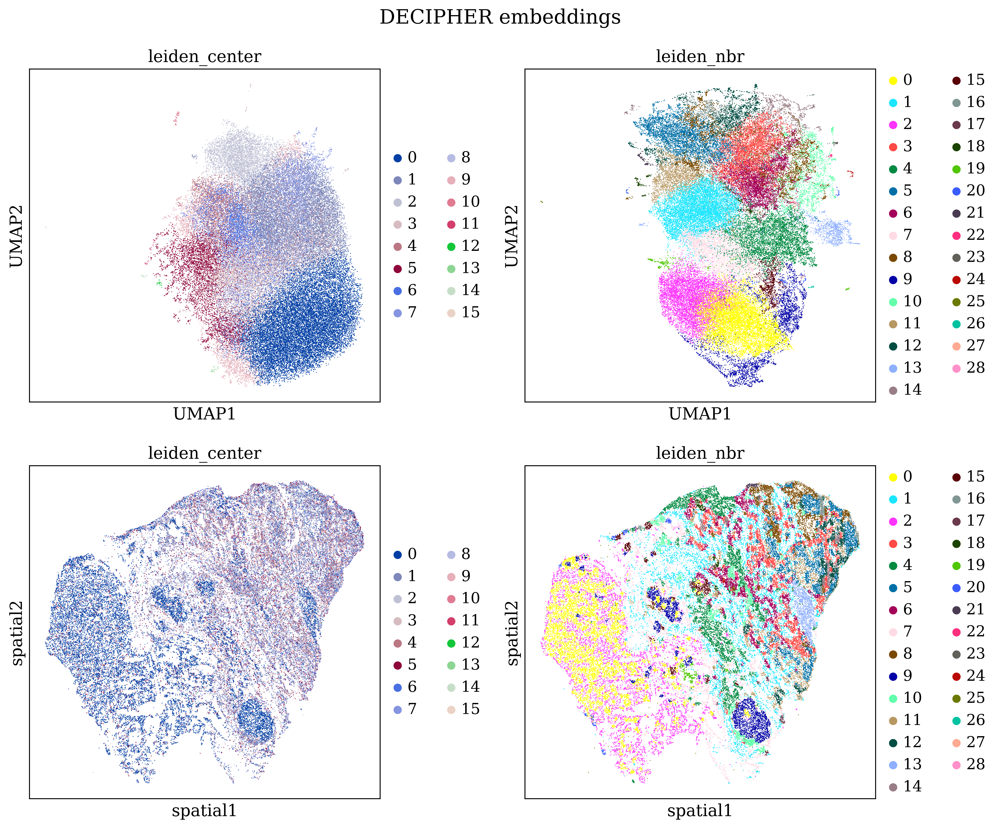

In [53]:
# Plot
size=2
fig, ax = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('DECIPHER embeddings')
adata.obsm['X_umap'] = adata.obsm['X_umap_center'].copy()
sc.pl.umap(adata, color=['leiden_center'], ax=ax[0, 0], show=False, s=size)
adata.obsm['X_umap'] = adata.obsm['X_umap_nbr'].copy()
sc.pl.umap(adata, color=['leiden_nbr'], ax=ax[0, 1], show=False, s=size)
sc.pl.embedding(adata, basis="spatial", color=f'leiden_center', s=size, show=False, ax=ax[1, 0])
sc.pl.embedding(adata, basis="spatial", color=f'leiden_nbr', s=size, show=False, ax=ax[1, 1])
plt.tight_layout()
plt.show()